In [41]:
import shutil
shutil.copy(
    "/kaggle/input/datasets/shaikabdussattar/new-images-lfw/AES.svg",
    "/kaggle/working/AES1.svg"
)

'/kaggle/working/AES1.svg'

In [42]:
import shutil

shutil.copy(
    "/kaggle/input/datasets/shaikabdussattar/new-images-lfw/AE_vs_VAE_Explained.svg",
    "/kaggle/working/AE_vs_VAE_Explained1.svg"
)


'/kaggle/working/AE_vs_VAE_Explained1.svg'

# LFW Face Generation and Latent Attribute Editing

In this notebook, I built an end-to-end workflow for face reconstruction and semantic latent editing on the LFW dataset. I kept the core model setup stable and focused on making each stage interpretable through structured analysis and visual diagnostics.


## 1. Autoencoder Fundamentals

![Autoencoder Concept](AES1.svg)

At the beginning of this project, I introduced the basic idea of an autoencoder: the encoder compresses a face image into a compact latent vector, and the decoder reconstructs the image from that representation.

In this notebook, I optimize reconstruction quality with **MSE loss** and I report **SSIM** as an additional structural-quality metric during analysis.


## 2. Variational Autoencoders and Key Differences

![AE vs VAE](AE_vs_VAE_Explained1.svg)

I also explained how a VAE differs conceptually from a deterministic autoencoder.

- In a standard autoencoder, the latent code is deterministic.
- In a VAE, the model learns a latent distribution (`mu`, `logvar`) and samples from it.

I included this comparison to clarify why latent regularization matters for generative smoothness, even though the main implementation here follows a deterministic dense autoencoder pipeline.


## 3. Imports and Environment

In this section, I set up the full Python environment for preprocessing, visualization, and model training. I also fixed random seeds so the experimental behavior is reproducible.


In [43]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import glob
import pandas as pd
import random
import numpy as np
import cv2
import imageio.v2 as imageio
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm.notebook import tqdm
from PIL import Image
from sklearn.model_selection import train_test_split

# Optional metric
try:
    from skimage.metrics import structural_similarity as ssim
    HAS_SSIM = True
except Exception:
    HAS_SSIM = False

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('Training on', DEVICE)
print('SSIM available:', HAS_SSIM)
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.linear_model import LogisticRegression

# Global plotting style (presentation only)
sns.set_theme(style='whitegrid', context='notebook')
plt.rcParams['figure.dpi'] = 120
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['axes.labelsize'] = 10


Training on cuda
SSIM available: True


## 4. Data Paths

Here I define the dataset paths used across all stages: image loading, metadata alignment, training, and evaluation.


In [44]:
DATASET_PATH = "/kaggle/input/lfw-dataset/lfw-deepfunneled/lfw-deepfunneled/"
ATTRIBUTES_PATH = "/kaggle/input/datasets/shaikabdussattar/labelled-faces-in-the-wild-lfw-dataset/lfw_attributes.txt"


## 5. Data Discovery and Exploratory Analysis

Before training the model, I performed an exploratory review of the dataset. I inspected identity frequencies and random face samples to understand class imbalance, image variety, and general data quality.


In [45]:
dataset = []
for path in glob.iglob(os.path.join(DATASET_PATH, "**", "*.jpg"), recursive=True):
    person = path.split("/")[-2]
    dataset.append({"person": person, "path": path})

dataset = pd.DataFrame(dataset)
# Frequency filtering to reduce dominance from very high-count identities.
dataset = dataset.groupby("person").filter(lambda x: len(x) < 25)

print('Images after frequency filter:', len(dataset))
print('Unique identities:', dataset['person'].nunique())
dataset.head(10)


Images after frequency filter: 10645
Unique identities: 5707


,person,path
0,Tyler_Hamilton,/kaggle/input/lfw-dataset/lfw-deepfunneled/lfw...
1,Tyler_Hamilton,/kaggle/input/lfw-dataset/lfw-deepfunneled/lfw...
2,Bernard_Siegel,/kaggle/input/lfw-dataset/lfw-deepfunneled/lfw...
3,Blythe_Danner,/kaggle/input/lfw-dataset/lfw-deepfunneled/lfw...
4,Blythe_Danner,/kaggle/input/lfw-dataset/lfw-deepfunneled/lfw...
5,Gene_Robinson,/kaggle/input/lfw-dataset/lfw-deepfunneled/lfw...
6,Gene_Robinson,/kaggle/input/lfw-dataset/lfw-deepfunneled/lfw...
7,Gene_Robinson,/kaggle/input/lfw-dataset/lfw-deepfunneled/lfw...
8,Gene_Robinson,/kaggle/input/lfw-dataset/lfw-deepfunneled/lfw...
9,Gene_Robinson,/kaggle/input/lfw-dataset/lfw-deepfunneled/lfw...


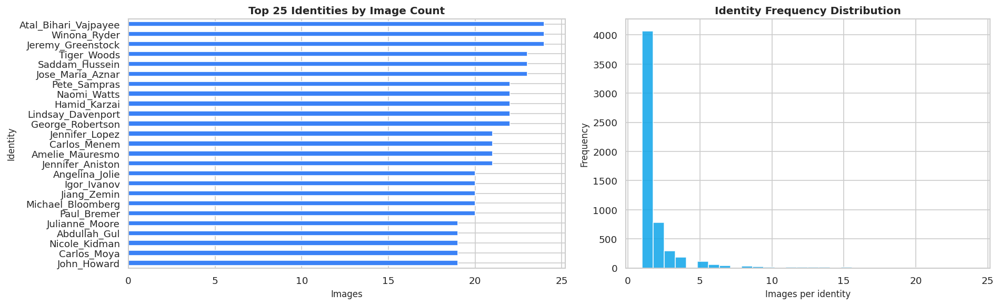

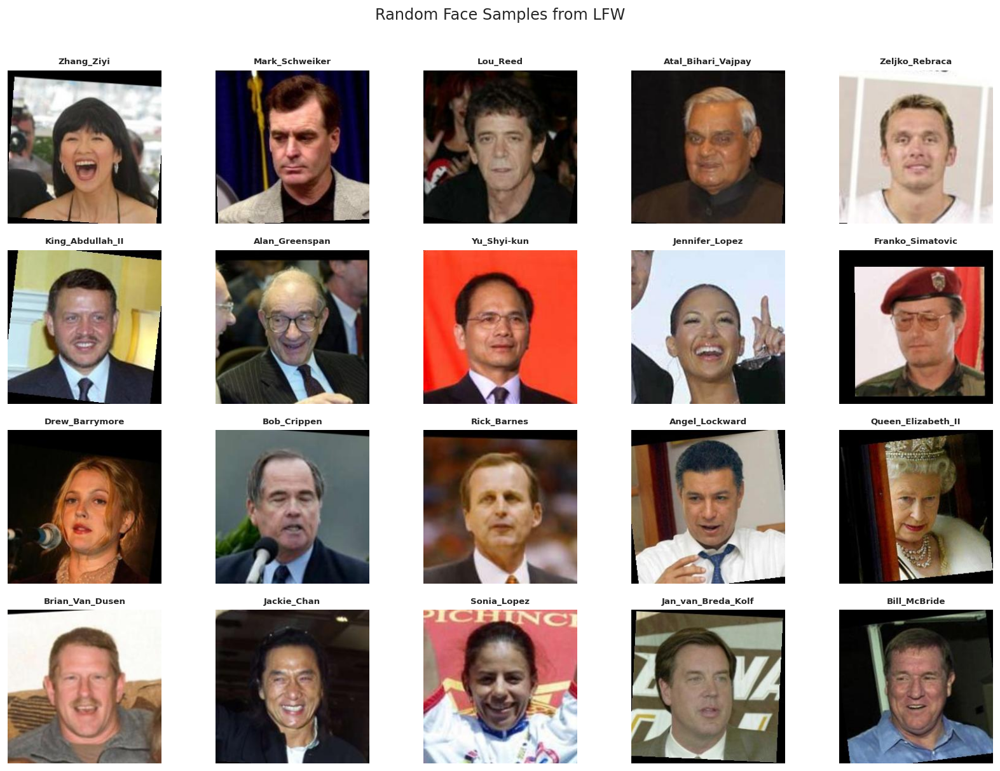

In [46]:
identity_counts = dataset.groupby("person").count()['path'].sort_values(ascending=False)

fig, axes = plt.subplots(1, 2, figsize=(16, 5), gridspec_kw={'width_ratios': [1.2, 1]})
identity_counts.head(25).sort_values().plot(kind='barh', ax=axes[0], color='#3b82f6')
axes[0].set_title('Top 25 Identities by Image Count')
axes[0].set_xlabel('Images')
axes[0].set_ylabel('Identity')

axes[1].hist(identity_counts.values, bins=30, color='#0ea5e9', alpha=0.85)
axes[1].set_title('Identity Frequency Distribution')
axes[1].set_xlabel('Images per identity')
axes[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(4, 5, figsize=(14, 10))
for i, ax in enumerate(axes.flatten()):
    idx = random.randint(0, len(dataset) - 1)
    img = plt.imread(dataset.path.iloc[idx])
    ax.imshow(img)
    ax.set_title(dataset.person.iloc[idx][:18], fontsize=8)
    ax.axis('off')
plt.suptitle('Random Face Samples from LFW', y=1.01)
plt.tight_layout()
plt.show()


## 6. Attribute-Aligned Dataset Construction

In this stage, I aligned image files with attribute records using `(person, imagenum)`. After alignment, I applied face-region cropping, resized all images to `45x45`, normalized to `[0, 1]`, and created train/validation splits for modeling.


In [47]:
def fetch_dataset(dx=80, dy=80, dimx=45, dimy=45):
    df_attrs = pd.read_csv(ATTRIBUTES_PATH, sep='	', skiprows=1)
    df_attrs = pd.DataFrame(df_attrs.iloc[:, :-1].values, columns=df_attrs.columns[1:])

    photo_ids = []
    for dirpath, _, filenames in os.walk(DATASET_PATH):
        for fname in filenames:
            if fname.endswith('.jpg'):
                fpath = os.path.join(dirpath, fname)
                photo_id = fname[:-4].replace('_', ' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])
                photo_ids.append({'person': person_id, 'imagenum': photo_number, 'photo_path': fpath})

    photo_ids = pd.DataFrame(photo_ids)
    df = pd.merge(df_attrs, photo_ids, on=('person', 'imagenum'))

    assert len(df) == len(df_attrs), 'Lost some rows while merging dataframes.'

    all_photos = (
        df['photo_path']
        .apply(imageio.imread)
        .apply(lambda img: img[dy:-dy, dx:-dx])
        .apply(lambda img: np.array(Image.fromarray(img).resize([dimx, dimy])))
    )

    all_photos = np.stack(all_photos.values).astype('uint8')
    all_attrs = df.drop(["photo_path", "person", "imagenum"], axis=1)

    return all_photos, all_attrs


data, attrs = fetch_dataset()
print('Image tensor shape:', data.shape)
print('Attributes shape:', attrs.shape)
attrs.head()


Image tensor shape: (13143, 45, 45, 3)
Attributes shape: (13143, 73)


,Male,Asian,White,Black,Baby,Child,Youth,Middle Aged,Senior,Black Hair,...,Pale Skin,5 o' Clock Shadow,Strong Nose-Mouth Lines,Wearing Lipstick,Flushed Face,High Cheekbones,Brown Eyes,Wearing Earrings,Wearing Necktie,Wearing Necklace
0,1.568346,-1.889043,1.737203,-0.929729,-1.471799,-0.19558,-0.835609,-0.351468,-1.012533,-0.719593,...,0.361738,1.166118,-1.164916,-1.13999,-2.371746,-1.299932,-0.414682,-1.144902,0.694007,-0.826609
1,0.169851,-0.982408,0.422709,-1.282184,-1.36006,-0.867002,-0.452293,-0.197521,-0.956073,-0.802107,...,-0.832036,-0.39768,0.87416,-0.945431,-0.268649,-0.006244,-0.030406,-0.480128,0.66676,-0.496559
2,0.997749,-1.364195,-0.157377,-0.756447,-1.891825,-0.871526,-0.862893,0.031445,-1.341523,-0.090037,...,1.549743,1.884745,-0.999765,-1.359858,-1.912108,-1.095634,0.915126,-0.572332,0.144262,-0.841231
3,1.122719,-1.997799,1.916144,-2.514214,-2.580071,-1.404239,0.057551,0.000196,-1.273512,-1.431462,...,0.567822,-0.176089,1.108125,-1.600944,-3.264613,0.813418,0.308631,-0.848693,0.475941,-0.447025
4,1.078214,-2.008098,1.676211,-2.278056,-2.651845,-1.348408,0.649089,0.017656,-1.889111,-1.857213,...,-1.461474,-0.955283,0.119113,-1.128176,-3.161048,0.08268,-0.439614,-0.359859,-0.760774,-0.410152


In [48]:
# Core dimensions from processed images
IMAGE_H = data.shape[1]
IMAGE_W = data.shape[2]
N_CHANNELS = 3

# Normalize and split
data = np.array(data / 255.0, dtype='float32')
X_train, X_val = train_test_split(data, test_size=0.2, random_state=42)

X_train = torch.FloatTensor(X_train)
X_val = torch.FloatTensor(X_val)

print('Train:', tuple(X_train.shape), '| Val:', tuple(X_val.shape))


Train: (10514, 45, 45, 3) | Val: (2629, 45, 45, 3)


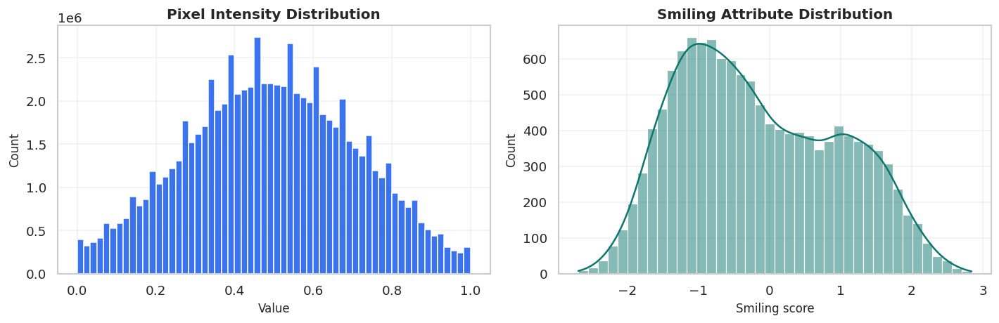

In [49]:
# Additional lightweight diagnostics
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].hist(data.ravel(), bins=60, color='#2563eb', alpha=0.9)
axes[0].set_title('Pixel Intensity Distribution')
axes[0].set_xlabel('Value')
axes[0].set_ylabel('Count')
axes[0].grid(alpha=0.25)

smile_score = attrs['Smiling'].astype(float)
sns.histplot(smile_score, bins=40, kde=True, ax=axes[1], color='#0f766e')
axes[1].set_title('Smiling Attribute Distribution')
axes[1].set_xlabel('Smiling score')
axes[1].grid(alpha=0.25)

plt.tight_layout()
plt.show()


### 6.1 Additional Computer Vision Diagnostics

To make preprocessing decisions more transparent, I added extra CV diagnostics:
- average-face visualization,
- edge structure analysis,
- CLAHE contrast inspection,
- smile-level behavior using edge density and sharpness trends.

These checks helped me verify that the processed data preserved useful structural cues.


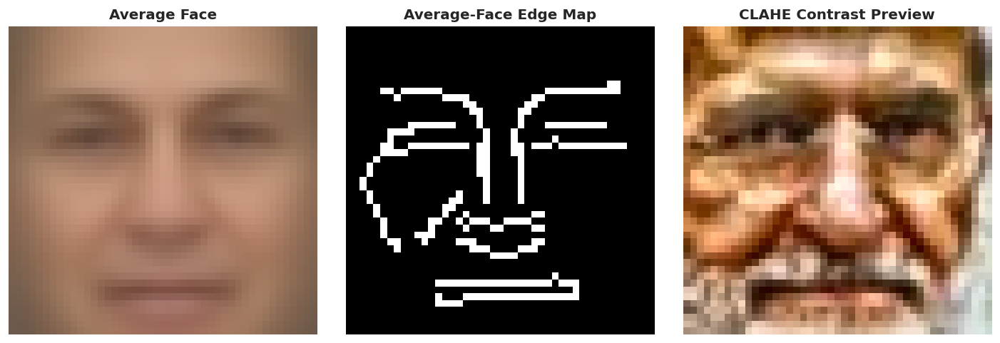

In [50]:
# Average face and edge structure
avg_face = data.mean(axis=0)
avg_u8 = (np.clip(avg_face, 0, 1) * 255).astype(np.uint8)
avg_edges = cv2.Canny(avg_u8, 50, 120)

# CLAHE preview for one random sample
sample_idx = np.random.randint(0, len(data))
sample_u8 = (np.clip(data[sample_idx], 0, 1) * 255).astype(np.uint8)
lab = cv2.cvtColor(sample_u8, cv2.COLOR_RGB2LAB)
l, a, b = cv2.split(lab)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
l2 = clahe.apply(l)
clahe_img = cv2.cvtColor(cv2.merge([l2, a, b]), cv2.COLOR_LAB2RGB)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(avg_face)
axes[0].set_title('Average Face')
axes[0].axis('off')
axes[1].imshow(avg_edges, cmap='gray')
axes[1].set_title('Average-Face Edge Map')
axes[1].axis('off')
axes[2].imshow(clahe_img)
axes[2].set_title('CLAHE Contrast Preview')
axes[2].axis('off')
plt.tight_layout()
plt.show()


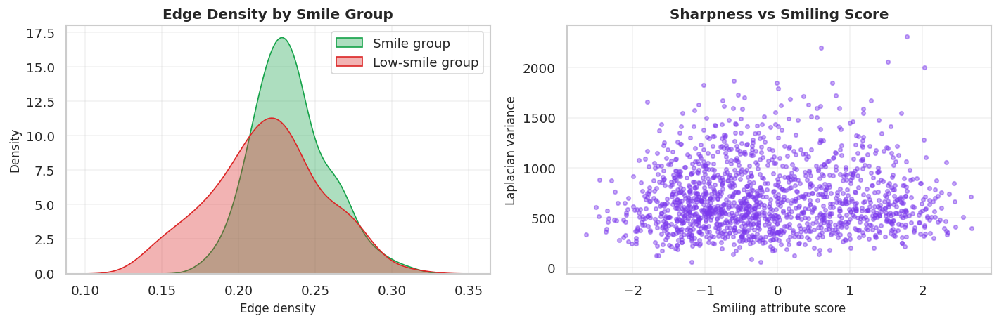

In [51]:
# Smile-related image statistics
smile_scores = attrs['Smiling'].astype(float)

hi_smile_idx = smile_scores.sort_values(ascending=False).iloc[100:250].index.values
lo_smile_idx = smile_scores.sort_values(ascending=True).head(150).index.values

def edge_density(img):
    gray = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray, 60, 120)
    return edges.mean() / 255.0

def sharpness(img):
    gray = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    return cv2.Laplacian(gray, cv2.CV_64F).var()

hi_edge = [edge_density(data[i]) for i in hi_smile_idx[:120]]
lo_edge = [edge_density(data[i]) for i in lo_smile_idx[:120]]

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
sns.kdeplot(hi_edge, label='Smile group', fill=True, alpha=0.35, ax=axes[0], color='#16a34a')
sns.kdeplot(lo_edge, label='Low-smile group', fill=True, alpha=0.35, ax=axes[0], color='#dc2626')
axes[0].set_title('Edge Density by Smile Group')
axes[0].set_xlabel('Edge density')
axes[0].grid(alpha=0.25)
axes[0].legend()

probe_idx = np.random.choice(len(data), size=min(1500, len(data)), replace=False)
probe_sharp = [sharpness(data[i]) for i in probe_idx]
probe_smile = smile_scores.iloc[probe_idx].values

axes[1].scatter(probe_smile, probe_sharp, s=11, alpha=0.45, color='#7c3aed')
axes[1].set_title('Sharpness vs Smiling Score')
axes[1].set_xlabel('Smiling attribute score')
axes[1].set_ylabel('Laplacian variance')
axes[1].grid(alpha=0.25)

plt.tight_layout()
plt.show()


## 7. Dense Autoencoder Architecture

In this section, I have used the dense autoencoder architecture :
- Encoder: `6075 -> 1500 -> 1000 -> 100`
- Decoder: `100 -> 1000 -> 1500 -> 6075`

I kept this architecture fixed throughout the notebook so I could analyze reconstruction quality and latent-editing behavior consistently.


In [52]:
dim_z = 100
INPUT_DIM = IMAGE_H * IMAGE_W * N_CHANNELS

class Autoencoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Linear(INPUT_DIM, 1500),
            nn.BatchNorm1d(1500),
            nn.ReLU(),
            nn.Linear(1500, 1000),
            nn.BatchNorm1d(1000),
            nn.ReLU(),
            nn.Linear(1000, dim_z),
            nn.BatchNorm1d(dim_z),
            nn.ReLU(),
        )
        self.decoder = nn.Sequential(
            nn.Linear(dim_z, 1000),
            nn.BatchNorm1d(1000),
            nn.ReLU(),
            nn.Linear(1000, 1500),
            nn.BatchNorm1d(1500),
            nn.ReLU(),
            nn.Linear(1500, INPUT_DIM),
        )

    def encode(self, x):
        return self.encoder(x)

    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        encoded = self.encode(x)
        decoded = self.decode(encoded)
        return encoded, decoded


class VAE(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Linear(INPUT_DIM, 1500),
            nn.BatchNorm1d(1500),
            nn.ReLU(),
            nn.Linear(1500, 1000),
            nn.BatchNorm1d(1000),
            nn.ReLU(),
        )
        self.fc_mu = nn.Linear(1000, dim_z)
        self.fc_logvar = nn.Linear(1000, dim_z)

        self.decoder = nn.Sequential(
            nn.Linear(dim_z, 1000),
            nn.BatchNorm1d(1000),
            nn.ReLU(),
            nn.Linear(1000, 1500),
            nn.BatchNorm1d(1500),
            nn.ReLU(),
            nn.Linear(1500, INPUT_DIM),
            nn.Sigmoid(),
        )

    def encode(self, x):
        h = self.encoder(x)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon = self.decode(z)
        return z, recon, mu, logvar


model_auto = Autoencoder().to(DEVICE)
model_vae = VAE().to(DEVICE)

print('AE params:', sum(p.numel() for p in model_auto.parameters()))
print('VAE params:', sum(p.numel() for p in model_vae.parameters()))


AE params: 21446375
VAE params: 21546275


## 8.1 Model Diagram and Training Objectives

![Dense Autoencoder Architecture](Dense_AE_Architecture.svg)

Before training, I presented the architecture diagram and explicitly documented the optimization objective used in this notebook.

- Optimization objective: **MSE reconstruction loss**
- Additional evaluation view: **SSIM-based quality analysis**


## 8. Training and Validation Protocol

I trained the model using the configuration I selected for this study:
- Optimizer: `Adam (lr=0.001)`
- Epochs: `50`
- Batch size: `64`

I also structured logs and plots so training dynamics and generalization behavior are easy to interpret.


VAE epoch:   0%|          | 0/50 [00:00<?, ?it/s]

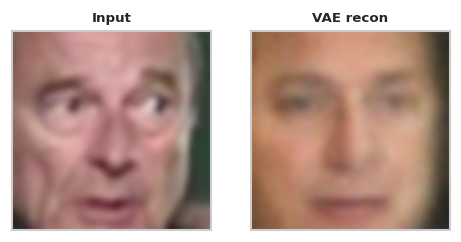

[VAE] Epoch 001 | train: 3846.8823 | val: 3832.5453 | recon: 3804.7331 | kl: 27.8121
[VAE] Epoch 002 | train: 3799.1242 | val: 3794.5428 | recon: 3767.4063 | kl: 27.1365
[VAE] Epoch 003 | train: 3781.6921 | val: 3780.4142 | recon: 3754.6575 | kl: 25.7568
[VAE] Epoch 004 | train: 3771.5830 | val: 3775.4546 | recon: 3749.9674 | kl: 25.4871
[VAE] Epoch 005 | train: 3765.1868 | val: 3760.0302 | recon: 3735.8055 | kl: 24.2247
[VAE] Epoch 006 | train: 3760.3785 | val: 3765.5711 | recon: 3741.9588 | kl: 23.6123
[VAE] Epoch 007 | train: 3756.5366 | val: 3758.6045 | recon: 3734.2472 | kl: 24.3573
[VAE] Epoch 008 | train: 3753.0031 | val: 3760.0181 | recon: 3735.6221 | kl: 24.3960
[VAE] Epoch 009 | train: 3750.6050 | val: 3762.6066 | recon: 3738.3071 | kl: 24.2995


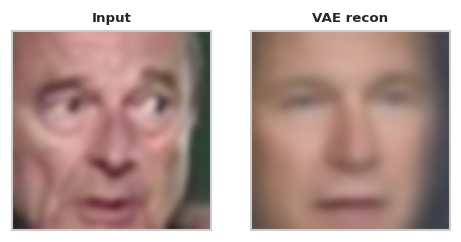

[VAE] Epoch 010 | train: 3748.3653 | val: 3755.4917 | recon: 3731.2248 | kl: 24.2669
[VAE] Epoch 011 | train: 3746.0503 | val: 3757.3504 | recon: 3732.8469 | kl: 24.5035
[VAE] Epoch 012 | train: 3744.5159 | val: 3757.2244 | recon: 3732.6269 | kl: 24.5975
[VAE] Epoch 013 | train: 3742.7746 | val: 3756.5376 | recon: 3731.3168 | kl: 25.2209
[VAE] Epoch 014 | train: 3741.4814 | val: 3759.8029 | recon: 3734.4872 | kl: 25.3157
[VAE] Epoch 015 | train: 3740.3649 | val: 3751.7606 | recon: 3726.1429 | kl: 25.6177
[VAE] Epoch 016 | train: 3739.2556 | val: 3744.3950 | recon: 3718.4517 | kl: 25.9433
[VAE] Epoch 017 | train: 3737.9740 | val: 3745.3659 | recon: 3719.5576 | kl: 25.8083
[VAE] Epoch 018 | train: 3736.8873 | val: 3749.2118 | recon: 3722.4785 | kl: 26.7333
[VAE] Epoch 019 | train: 3735.8775 | val: 3745.3218 | recon: 3718.9831 | kl: 26.3387


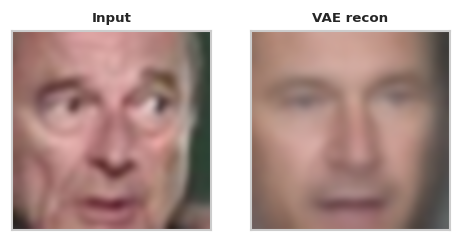

[VAE] Epoch 020 | train: 3734.9987 | val: 3747.5061 | recon: 3721.2299 | kl: 26.2762
[VAE] Epoch 021 | train: 3733.7744 | val: 3745.0457 | recon: 3718.2622 | kl: 26.7835
[VAE] Epoch 022 | train: 3732.9242 | val: 3742.0047 | recon: 3715.3414 | kl: 26.6633
[VAE] Epoch 023 | train: 3732.1252 | val: 3746.1711 | recon: 3719.0632 | kl: 27.1079
[VAE] Epoch 024 | train: 3731.4165 | val: 3743.8546 | recon: 3716.3945 | kl: 27.4601
[VAE] Epoch 025 | train: 3730.5038 | val: 3745.2037 | recon: 3718.2542 | kl: 26.9496
[VAE] Epoch 026 | train: 3729.3389 | val: 3738.5720 | recon: 3711.0638 | kl: 27.5081
[VAE] Epoch 027 | train: 3728.7434 | val: 3743.6472 | recon: 3715.0874 | kl: 28.5597
[VAE] Epoch 028 | train: 3727.8130 | val: 3747.3381 | recon: 3719.3259 | kl: 28.0121
[VAE] Epoch 029 | train: 3727.2384 | val: 3742.6927 | recon: 3714.5706 | kl: 28.1221


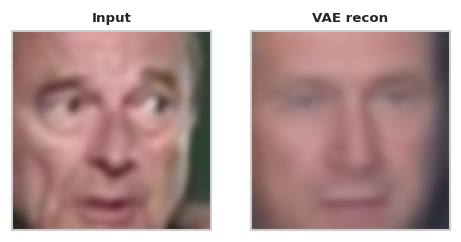

[VAE] Epoch 030 | train: 3726.1351 | val: 3741.0059 | recon: 3713.2951 | kl: 27.7109
[VAE] Epoch 031 | train: 3725.2605 | val: 3748.1970 | recon: 3719.0999 | kl: 29.0971
[VAE] Epoch 032 | train: 3724.2606 | val: 3739.4191 | recon: 3711.8695 | kl: 27.5496
[VAE] Epoch 033 | train: 3723.5375 | val: 3738.5387 | recon: 3710.5148 | kl: 28.0239
[VAE] Epoch 034 | train: 3722.5315 | val: 3742.1623 | recon: 3713.7554 | kl: 28.4069
[VAE] Epoch 035 | train: 3721.9035 | val: 3741.3255 | recon: 3712.6260 | kl: 28.6994
[VAE] Epoch 036 | train: 3720.9545 | val: 3740.9809 | recon: 3712.8885 | kl: 28.0925
[VAE] Epoch 037 | train: 3719.6857 | val: 3743.0878 | recon: 3713.4751 | kl: 29.6127
[VAE] Epoch 038 | train: 3718.9747 | val: 3742.7763 | recon: 3713.6928 | kl: 29.0835
[VAE] Epoch 039 | train: 3717.9607 | val: 3743.8173 | recon: 3715.1938 | kl: 28.6235


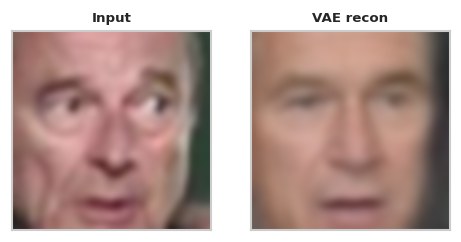

[VAE] Epoch 040 | train: 3717.6875 | val: 3744.5166 | recon: 3715.2343 | kl: 29.2823
[VAE] Epoch 041 | train: 3717.1474 | val: 3743.6285 | recon: 3713.7082 | kl: 29.9203
[VAE] Epoch 042 | train: 3716.1027 | val: 3744.3972 | recon: 3715.0423 | kl: 29.3548
[VAE] Epoch 043 | train: 3715.5039 | val: 3743.9367 | recon: 3714.8030 | kl: 29.1337
[VAE] Epoch 044 | train: 3715.1139 | val: 3743.3025 | recon: 3714.7398 | kl: 28.5628
[VAE] Epoch 045 | train: 3714.3611 | val: 3743.2952 | recon: 3713.7013 | kl: 29.5939
[VAE] Epoch 046 | train: 3713.9621 | val: 3745.7819 | recon: 3716.7622 | kl: 29.0196
[VAE] Epoch 047 | train: 3713.0991 | val: 3746.8066 | recon: 3717.8599 | kl: 28.9466
[VAE] Epoch 048 | train: 3712.5110 | val: 3745.9137 | recon: 3716.4932 | kl: 29.4204
[VAE] Epoch 049 | train: 3711.9566 | val: 3745.1073 | recon: 3715.4831 | kl: 29.6242


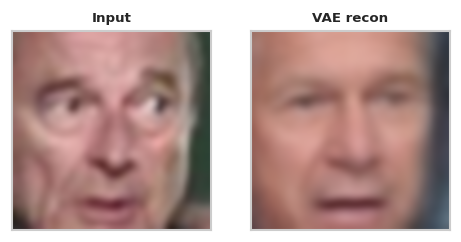

[VAE] Epoch 050 | train: 3711.7963 | val: 3750.0635 | recon: 3718.6665 | kl: 31.3970
Active training/model pipeline: VAE only


In [53]:
def get_batch(data, batch_size=64):
    total_len = data.shape[0]
    for i in range(0, total_len, batch_size):
        yield data[i:min(i + batch_size, total_len)]


def plot_gallery(images, h, w, n_row=3, n_col=6, with_title=False, titles=[]):
    plt.figure(figsize=(1.9 * n_col, 2.0 * n_row))
    plt.subplots_adjust(bottom=0.02, left=0.02, right=.98, top=.93, hspace=.28)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        try:
            img = np.array(images[i]).reshape((h, w, 3))
            plt.imshow(np.clip(img, 0, 1), interpolation='bicubic')
            if with_title and i < len(titles):
                plt.title(str(titles[i]), fontsize=8)
            plt.xticks(())
            plt.yticks(())
        except Exception:
            pass
    plt.show()


ACTIVE_MODEL = 'vae'  # fixed to VAE-only pipeline


def get_active_model(model_name=None):
    return model_vae, 'vae'


def get_reconstruction(model, flat_inputs):
    _, recon, _, _ = model(flat_inputs)
    return recon


def encode_latent(model, flat_inputs, use_mean=True):
    mu, logvar = model.encode(flat_inputs)
    if use_mean:
        return mu
    return model.reparameterize(mu, logvar)


def preview_reconstruction(model, x_val, tag='VAE recon'):
    with torch.set_grad_enabled(False):
        pic = x_val[10]
        pic_input = pic.view(-1, INPUT_DIM).to(DEVICE)
        recon = get_reconstruction(model, pic_input)
        pic_output = recon.view(-1, INPUT_DIM).squeeze().to('cpu')
        pic_input = pic_input.to('cpu')
        plot_gallery([pic_input, pic_output], IMAGE_H, IMAGE_W, 1, 2, with_title=True, titles=['Input', tag])


def vae_loss_fn(recon_x, x, mu, logvar, beta=1.0):
    recon_loss = F.binary_cross_entropy(recon_x, x, reduction='sum') / x.shape[0]
    kld = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp()) / x.shape[0]
    total = recon_loss + beta * kld
    return total, recon_loss, kld


def fit_epoch_vae(model, train_x, optimizer, batch_size, beta=1.0):
    model.train()
    running_total, running_recon, running_kld = 0.0, 0.0, 0.0
    processed_data = 0

    for inputs in get_batch(train_x, batch_size):
        inputs = inputs.view(-1, INPUT_DIM).to(DEVICE)
        optimizer.zero_grad()

        _, recon, mu, logvar = model(inputs)
        loss, recon_loss, kld = vae_loss_fn(recon, inputs, mu, logvar, beta=beta)
        loss.backward()
        optimizer.step()

        bs = inputs.shape[0]
        running_total += loss.item() * bs
        running_recon += recon_loss.item() * bs
        running_kld += kld.item() * bs
        processed_data += bs

    return (
        running_total / processed_data,
        running_recon / processed_data,
        running_kld / processed_data,
    )


def eval_epoch_vae(model, x_val, batch_size=64, beta=1.0, preview=True):
    model.eval()
    running_total, running_recon, running_kld = 0.0, 0.0, 0.0
    processed_data = 0

    for inputs in get_batch(x_val, batch_size):
        inputs = inputs.view(-1, INPUT_DIM).to(DEVICE)
        with torch.set_grad_enabled(False):
            _, recon, mu, logvar = model(inputs)
            loss, recon_loss, kld = vae_loss_fn(recon, inputs, mu, logvar, beta=beta)

        bs = inputs.shape[0]
        running_total += loss.item() * bs
        running_recon += recon_loss.item() * bs
        running_kld += kld.item() * bs
        processed_data += bs

    val_total = running_total / processed_data
    val_recon = running_recon / processed_data
    val_kld = running_kld / processed_data

    if preview:
        preview_reconstruction(model, x_val, tag='VAE recon')

    return val_total, val_recon, val_kld


def train_vae(train_x, val_x, model, epochs=10, batch_size=32, lr=0.001, beta=1.0):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    history = []

    with tqdm(desc='VAE epoch', total=epochs) as pbar_outer:
        for epoch in range(epochs):
            train_total, train_recon, train_kld = fit_epoch_vae(model, train_x, optimizer, batch_size, beta=beta)
            preview = (epoch == 0) or ((epoch + 1) % 10 == 0) or (epoch == epochs - 1)
            val_total, val_recon, val_kld = eval_epoch_vae(model, val_x, batch_size=batch_size, beta=beta, preview=preview)

            history.append({
                'train_loss': train_total,
                'val_loss': val_total,
                'val_recon_loss': val_recon,
                'val_kl_loss': val_kld,
            })

            pbar_outer.update(1)
            tqdm.write(
                f"[VAE] Epoch {epoch+1:03d} | train: {train_total:.4f} | val: {val_total:.4f} "
                f"| recon: {val_recon:.4f} | kl: {val_kld:.4f}"
            )

    return history


history_vae = train_vae(X_train, X_val, model_vae, epochs=50, batch_size=64, lr=0.001, beta=1.0)

# Backward-compatible alias for downstream cells.
history = history_vae

print('Active training/model pipeline: VAE only')


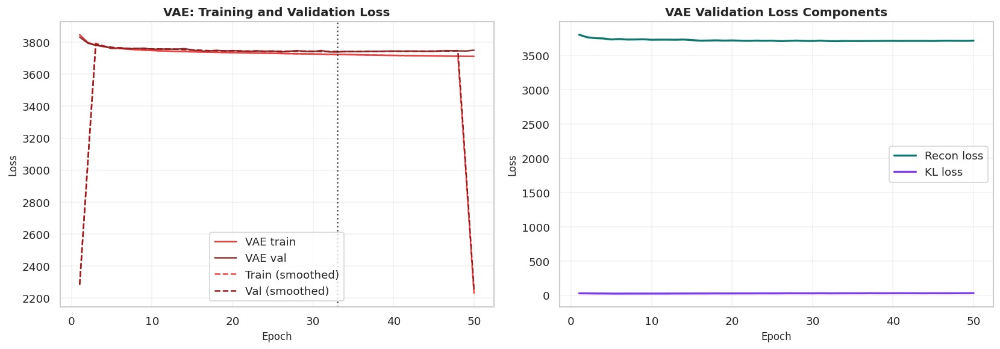

,epoch,train_loss,val_loss,val_recon_loss,val_kl_loss,gap
32,33,3723.537533,3738.538678,3710.514802,28.023864,15.001145
25,26,3729.338871,3738.571954,3711.063838,27.508101,9.233083
31,32,3724.260582,3739.419112,3711.869514,27.549603,15.158530
35,36,3720.954513,3740.980933,3712.888480,28.092460,20.026420
29,30,3726.135104,3741.005933,3713.295091,27.710850,14.870829
34,35,3721.903501,3741.325474,3712.626024,28.699444,19.421973
21,22,3732.924152,3742.004690,3715.341365,26.663317,9.080538
33,34,3722.531468,3742.162304,3713.755428,28.406891,19.630836
28,29,3727.238359,3742.692730,3714.570637,28.122108,15.454371
37,38,3718.974734,3742.776299,3713.692837,29.083462,23.801566


In [54]:
vae_df = pd.DataFrame(history_vae)
epochs = np.arange(1, len(vae_df) + 1)

def smooth_curve(arr, k=5):
    arr = np.asarray(arr)
    if len(arr) < k:
        return arr
    kernel = np.ones(k) / k
    return np.convolve(arr, kernel, mode='same')

best_epoch_vae = int(vae_df['val_loss'].idxmin()) + 1

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(epochs, vae_df['train_loss'], label='VAE train', color='#dc2626', alpha=0.9)
axes[0].plot(epochs, vae_df['val_loss'], label='VAE val', color='#7f1d1d', alpha=0.9)
axes[0].plot(epochs, smooth_curve(vae_df['train_loss']), '--', color='#ef4444', label='Train (smoothed)')
axes[0].plot(epochs, smooth_curve(vae_df['val_loss']), '--', color='#991b1b', label='Val (smoothed)')
axes[0].axvline(best_epoch_vae, color='black', linestyle=':', alpha=0.7)
axes[0].set_title('VAE: Training and Validation Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend()
axes[0].grid(alpha=0.25)

axes[1].plot(epochs, vae_df['val_recon_loss'], label='Recon loss', color='#0f766e', lw=2)
axes[1].plot(epochs, vae_df['val_kl_loss'], label='KL loss', color='#7c3aed', lw=2)
axes[1].set_title('VAE Validation Loss Components')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend()
axes[1].grid(alpha=0.25)

plt.tight_layout()
plt.show()

summary_df = pd.DataFrame({
    'epoch': epochs,
    'train_loss': vae_df['train_loss'].values,
    'val_loss': vae_df['val_loss'].values,
    'val_recon_loss': vae_df['val_recon_loss'].values,
    'val_kl_loss': vae_df['val_kl_loss'].values,
})
summary_df['gap'] = summary_df['val_loss'] - summary_df['train_loss']
summary_df.sort_values('val_loss').head(10)


## 9. Reconstruction and Generation Results

After training, I evaluated the model with multiple complementary views:
- random latent generation,
- reconstruction comparisons,
- per-sample error maps,
- SSIM summaries.

This allowed me to assess both quantitative and qualitative reconstruction quality.


Latent sample shape: (16, 100) | Model: VAE


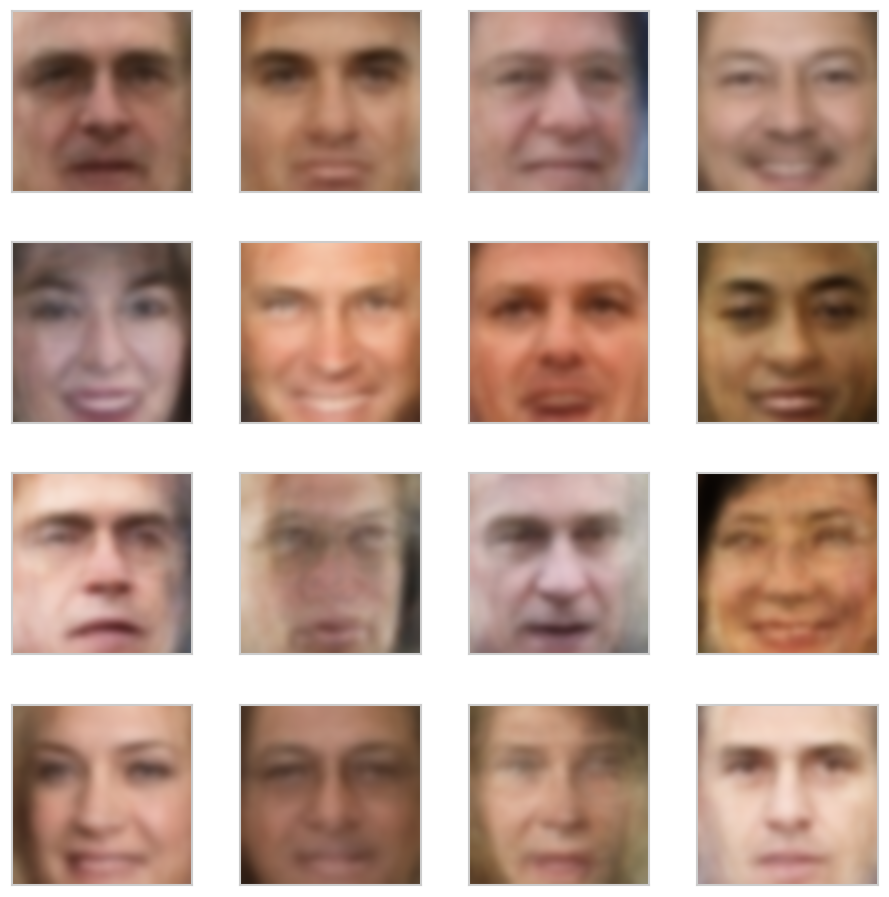

In [55]:
# Random latent sampling and face generation (VAE)
z = np.random.randn(16, dim_z).astype(np.float32)
print(f'Latent sample shape: {z.shape} | Model: VAE')

with torch.no_grad():
    inputs = torch.FloatTensor(z).to(DEVICE)
    model_vae.eval()
    output = model_vae.decode(inputs).data.cpu().numpy()

plot_gallery(output, IMAGE_H, IMAGE_W, n_row=4, n_col=4)


Reconstruction preview: VAE


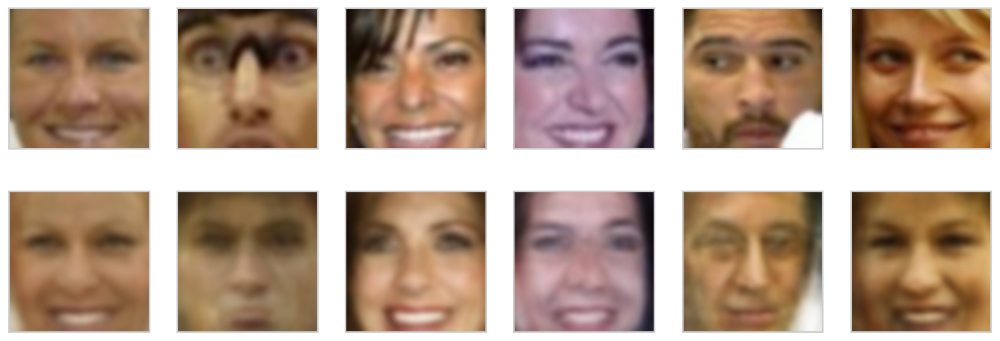

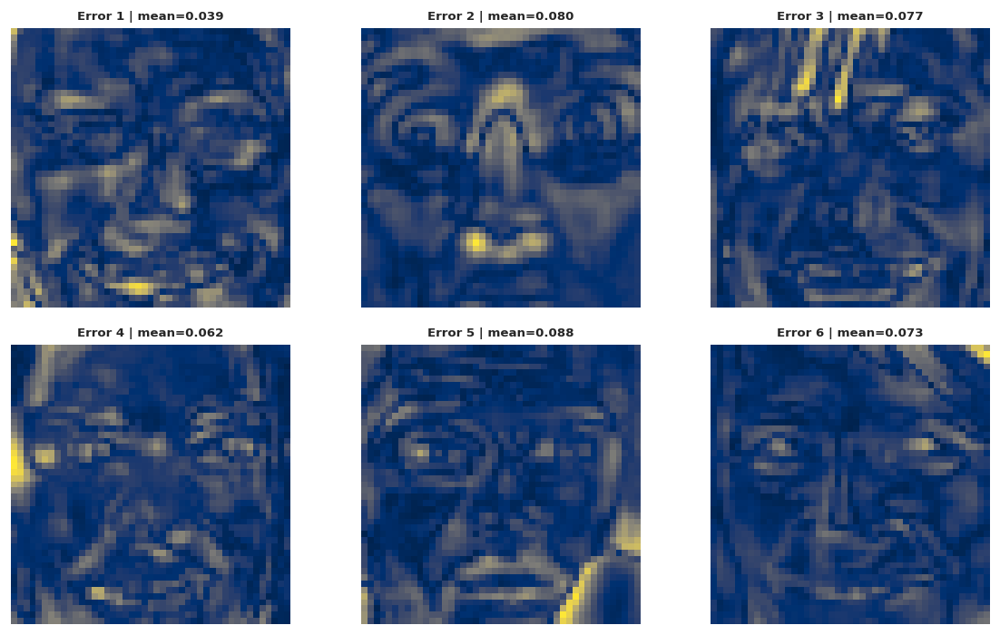

Mean absolute reconstruction error [VAE]: 0.069866


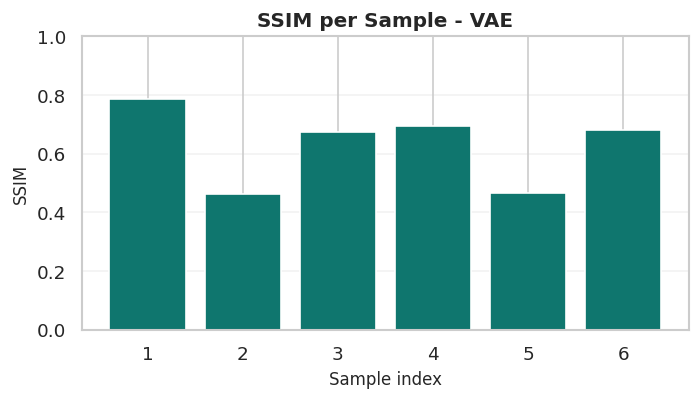

Mean SSIM [VAE]: 0.6268


In [56]:
# Reconstruction diagnostics (with cividis error maps) for VAE
n_samples = 6
orig = X_val[:n_samples].numpy()

with torch.no_grad():
    model_vae.eval()
    recon_in = X_val[:n_samples].view(-1, INPUT_DIM).to(DEVICE)
    recon_out = get_reconstruction(model_vae, recon_in)

reco = recon_out.view(-1, IMAGE_H, IMAGE_W, N_CHANNELS).cpu().numpy()

print('Reconstruction preview: VAE')
comparison = np.concatenate([orig, reco], axis=0)
plot_gallery(comparison, IMAGE_H, IMAGE_W, n_row=2, n_col=n_samples)

# Error maps (compact panel)
fig, axes = plt.subplots(2, 3, figsize=(10, 6))
errs = []
for i, ax in enumerate(axes.flatten()):
    err = np.abs(orig[i] - reco[i]).mean(axis=2)
    errs.append(float(err.mean()))
    ax.imshow(err, cmap='cividis')
    ax.set_title(f'Error {i+1} | mean={err.mean():.3f}', fontsize=8)
    ax.axis('off')
plt.tight_layout()
plt.show()

print('Mean absolute reconstruction error [VAE]:', round(float(np.mean(np.abs(orig - reco))), 6))

if HAS_SSIM:
    ssim_vals = []
    for i in range(len(orig)):
        s1 = cv2.cvtColor((np.clip(orig[i], 0, 1) * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
        s2 = cv2.cvtColor((np.clip(reco[i], 0, 1) * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
        ssim_vals.append(ssim(s1, s2, data_range=255))

    fig, ax = plt.subplots(1, 1, figsize=(6, 3.5))
    ax.bar(np.arange(1, len(ssim_vals) + 1), ssim_vals, color='#0f766e')
    ax.set_ylim(0, 1)
    ax.set_title('SSIM per Sample - VAE')
    ax.set_xlabel('Sample index')
    ax.set_ylabel('SSIM')
    ax.grid(axis='y', alpha=0.25)
    plt.tight_layout()
    plt.show()

    print('Mean SSIM [VAE]:', round(float(np.mean(ssim_vals)), 4))


## 10. Attribute Buckets and Latent Editing

In this section, I grouped faces by attribute strength (smile / no-smile / eyeglasses / sunglasses), computed latent directions, and applied vector arithmetic for semantic edits.

This is where I demonstrate practical controllability of the learned latent space.


In [57]:
smile_ids = attrs['Smiling'].sort_values(ascending=False).iloc[100:125].index.values
smile_data = data[smile_ids]

no_smile_ids = attrs['Smiling'].sort_values(ascending=True).head(25).index.values
no_smile_data = data[no_smile_ids]

eyeglasses_ids = attrs['Eyeglasses'].sort_values(ascending=False).head(25).index.values
eyeglasses_data = data[eyeglasses_ids]

sunglasses_ids = attrs['Sunglasses'].sort_values(ascending=False).head(25).index.values
sunglasses_data = data[sunglasses_ids]



High Smile Faces


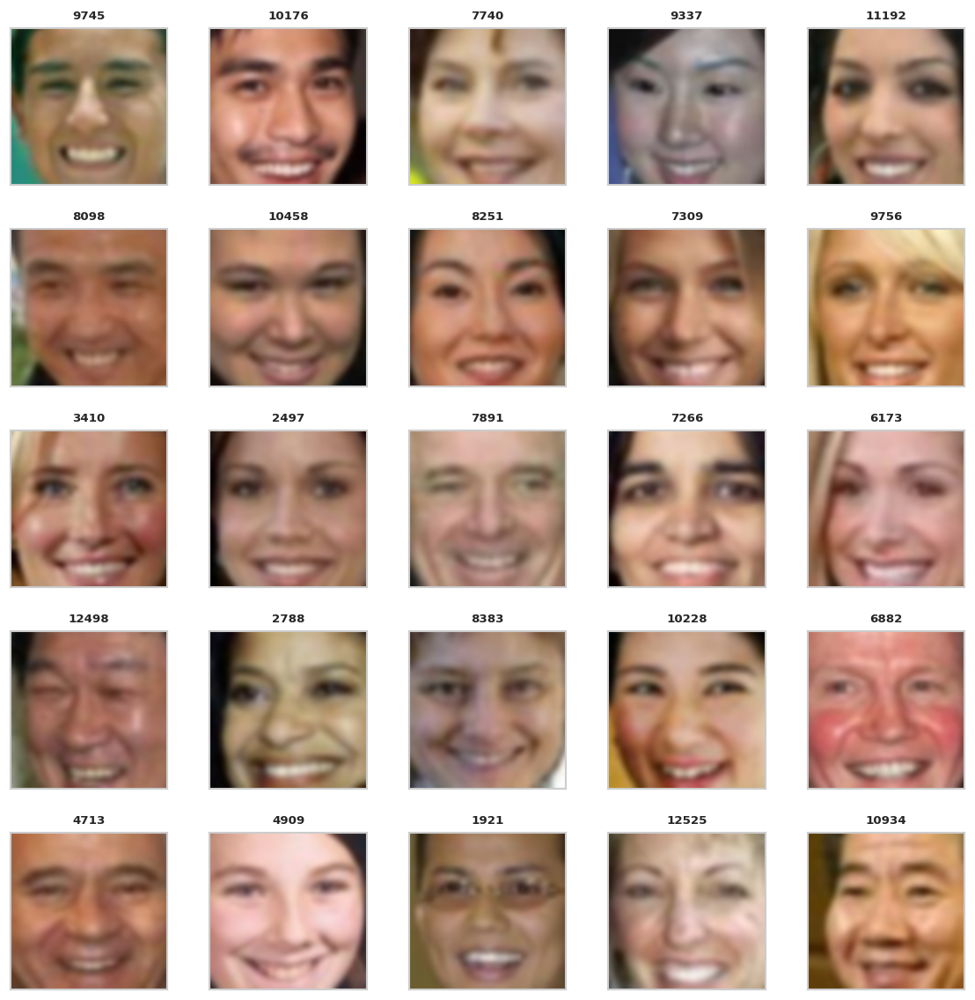


Low Smile Faces


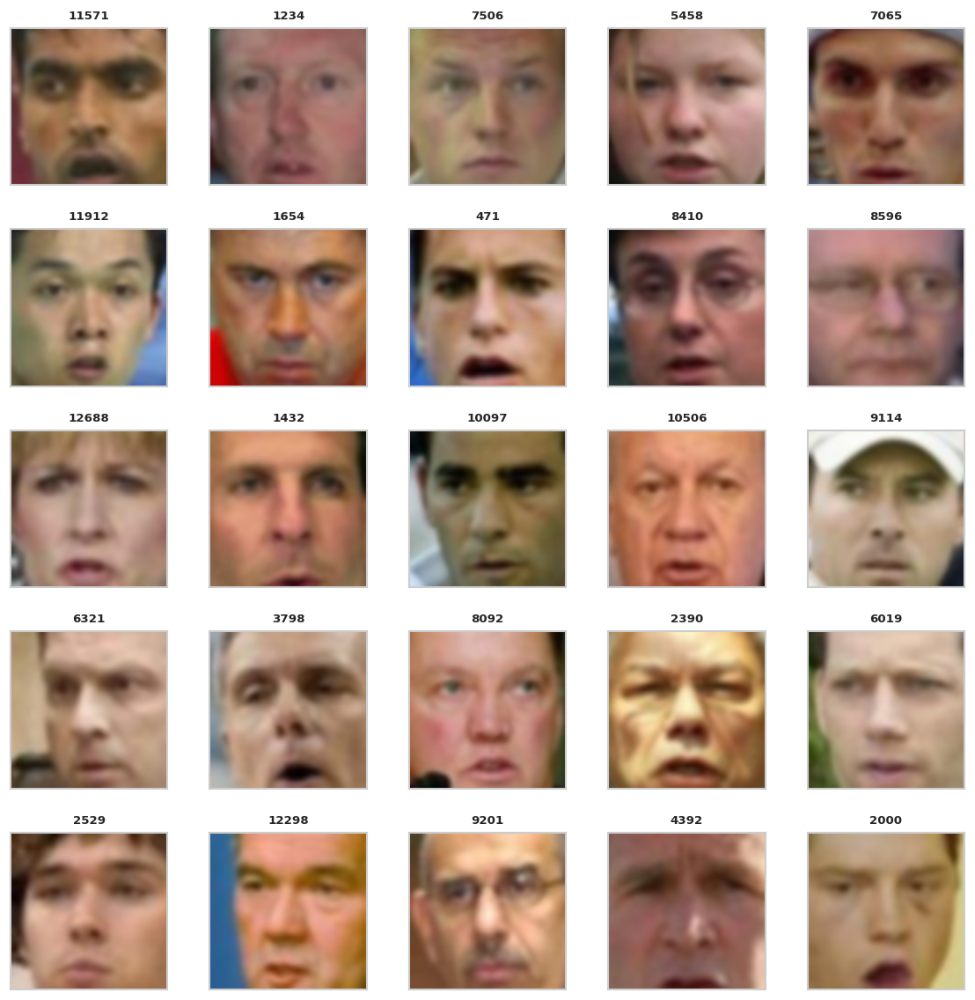


Eyeglasses Faces


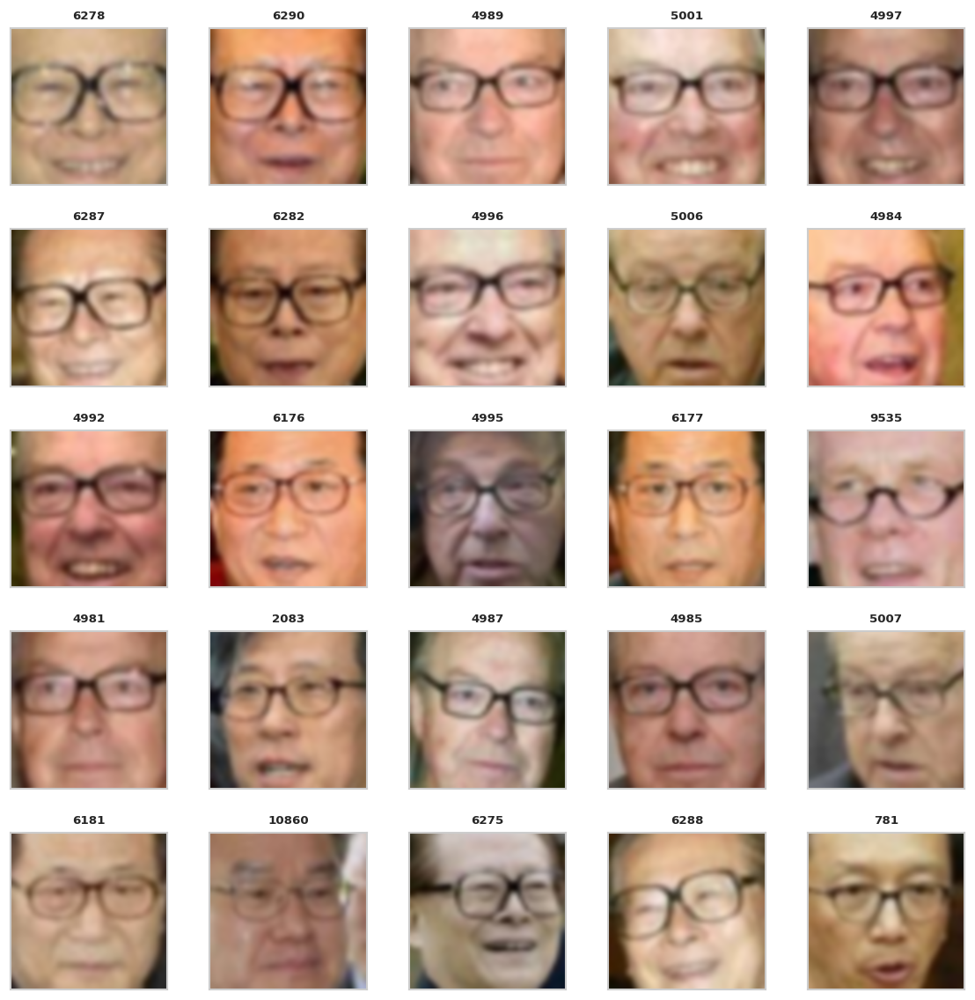


Sunglasses Faces


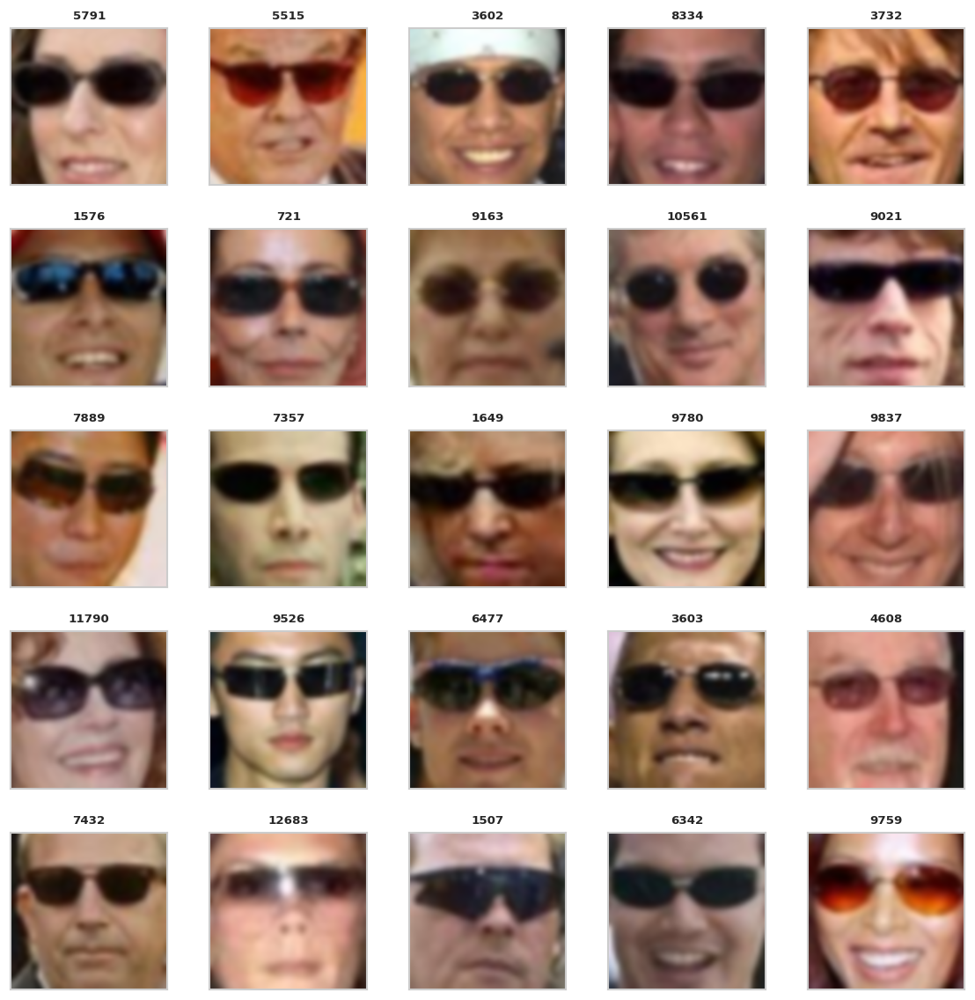

In [58]:
groups = [
    ('High Smile Faces', smile_data, smile_ids),
    ('Low Smile Faces', no_smile_data, no_smile_ids),
    ('Eyeglasses Faces', eyeglasses_data, eyeglasses_ids),
    ('Sunglasses Faces', sunglasses_data, sunglasses_ids),
]

for title, imgs, ids in groups:
    print(f"\n{title}")
    plot_gallery(imgs, IMAGE_H, IMAGE_W, n_row=5, n_col=5, with_title=True, titles=ids)


In [59]:
def to_latent(pic, model_name=None, use_mean=True):
    with torch.no_grad():
        inputs = torch.FloatTensor(pic.reshape(-1, INPUT_DIM)).to(DEVICE)
        model_vae.eval()
        output = encode_latent(model_vae, inputs, use_mean=use_mean)
        return output


def from_latent(vec, model_name=None):
    with torch.no_grad():
        inputs = vec.to(DEVICE)
        model_vae.eval()
        output = model_vae.decode(inputs)
        return output


smile_latent = to_latent(smile_data).mean(axis=0)
no_smile_latent = to_latent(no_smile_data).mean(axis=0)
sunglasses_latent = to_latent(sunglasses_data).mean(axis=0)

smile_vec = smile_latent - no_smile_latent
sunglasses_vec = sunglasses_latent - smile_latent

print('Latent editing model: VAE')


def show_pair_edits(ids, direction_vec, title, n_samples=6):
    selected_ids = list(ids[3:n_samples+3])
    imgs = []
    for idx in selected_ids:
        pic = data[idx:idx + 1]
        latent_vec = to_latent(pic)
        latent_vec[0] += direction_vec
        pic_output = from_latent(latent_vec).view(-1, IMAGE_H, IMAGE_W, N_CHANNELS).cpu().numpy()[0]
        imgs.extend([pic[0], pic_output])

    titles = []
    for idx in selected_ids:
        titles.extend([f'Orig {idx}', f'Edit {idx}'])

    print(title)
    plot_gallery(imgs, IMAGE_H, IMAGE_W, n_row=len(selected_ids), n_col=2, with_title=True, titles=titles)


def make_me_smile(ids, n_samples=6):
    show_pair_edits(ids, smile_vec, 'Smile edits (VAE)', n_samples=n_samples)


def give_me_sunglasses(ids, n_samples=6):
    show_pair_edits(ids, sunglasses_vec, 'Sunglasses edits (VAE)', n_samples=n_samples)


Latent editing model: VAE


### 10.1 Latent-Space Visualization and Direction Analysis

To interpret what the model learned internally, I added:
- latent interpolation,
- PCA and t-SNE latent projections,
- classifier-derived latent direction comparison against mean-difference vectors.

These analyses helped me check whether edited directions are coherent and separable.


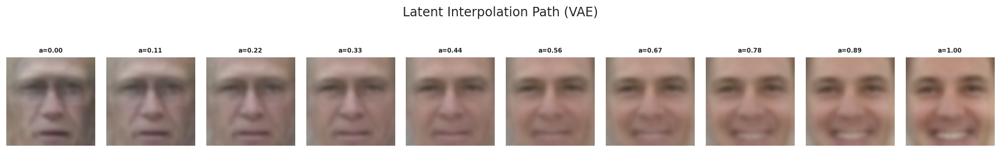

In [60]:
# Latent interpolation (decoder continuity check) - VAE
def latent_interpolation(steps=10):
    z1 = np.random.randn(dim_z)
    z2 = np.random.randn(dim_z)
    alphas = np.linspace(0, 1, steps)

    z_stack = np.array([(1 - a) * z1 + a * z2 for a in alphas], dtype=np.float32)
    with torch.no_grad():
        model_vae.eval()
        decoded = model_vae.decode(torch.FloatTensor(z_stack).to(DEVICE)).cpu().numpy()

    plt.figure(figsize=(16, 2.5))
    for i, (img, a) in enumerate(zip(decoded, alphas)):
        ax = plt.subplot(1, steps, i + 1)
        ax.imshow(np.clip(img.reshape(IMAGE_H, IMAGE_W, N_CHANNELS), 0, 1), interpolation='bicubic')
        ax.set_title(f"a={a:.2f}", fontsize=7)
        ax.axis('off')
    plt.suptitle('Latent Interpolation Path (VAE)', y=1.03)
    plt.tight_layout()
    plt.show()

latent_interpolation(steps=10)


/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/ipykernel_55/1526615409.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


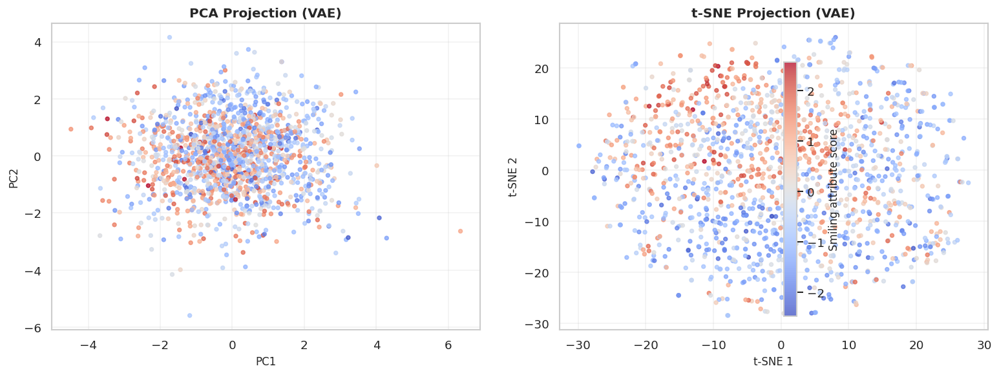

In [61]:
# PCA and t-SNE on latent vectors, colored by smiling score (VAE)
viz_idx = np.random.choice(len(data), size=min(1500, len(data)), replace=False)
lat_viz = to_latent(data[viz_idx]).detach().cpu().numpy()
smile_viz = attrs.iloc[viz_idx]['Smiling'].astype(float).values

pca_2d = PCA(n_components=2, random_state=SEED).fit_transform(lat_viz)
tsne_2d = TSNE(
    n_components=2,
    perplexity=35,
    learning_rate='auto',
    init='pca',
    n_iter=500,
    random_state=SEED,
).fit_transform(lat_viz)

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
sc0 = axes[0].scatter(pca_2d[:, 0], pca_2d[:, 1], c=smile_viz, cmap='coolwarm', s=12, alpha=0.75)
axes[0].set_title('PCA Projection (VAE)')
axes[0].set_xlabel('PC1')
axes[0].set_ylabel('PC2')
axes[0].grid(alpha=0.25)

sc1 = axes[1].scatter(tsne_2d[:, 0], tsne_2d[:, 1], c=smile_viz, cmap='coolwarm', s=12, alpha=0.75)
axes[1].set_title('t-SNE Projection (VAE)')
axes[1].set_xlabel('t-SNE 1')
axes[1].set_ylabel('t-SNE 2')
axes[1].grid(alpha=0.25)

cbar = fig.colorbar(sc1, ax=axes.ravel().tolist(), shrink=0.85)
cbar.set_label('Smiling attribute score')
plt.tight_layout()
plt.show()


[VAE] Binary latent smile classifier accuracy: 0.9647
[VAE] Cosine similarity (mean-diff vs classifier direction): 0.7464
VAE mean-difference smile edits


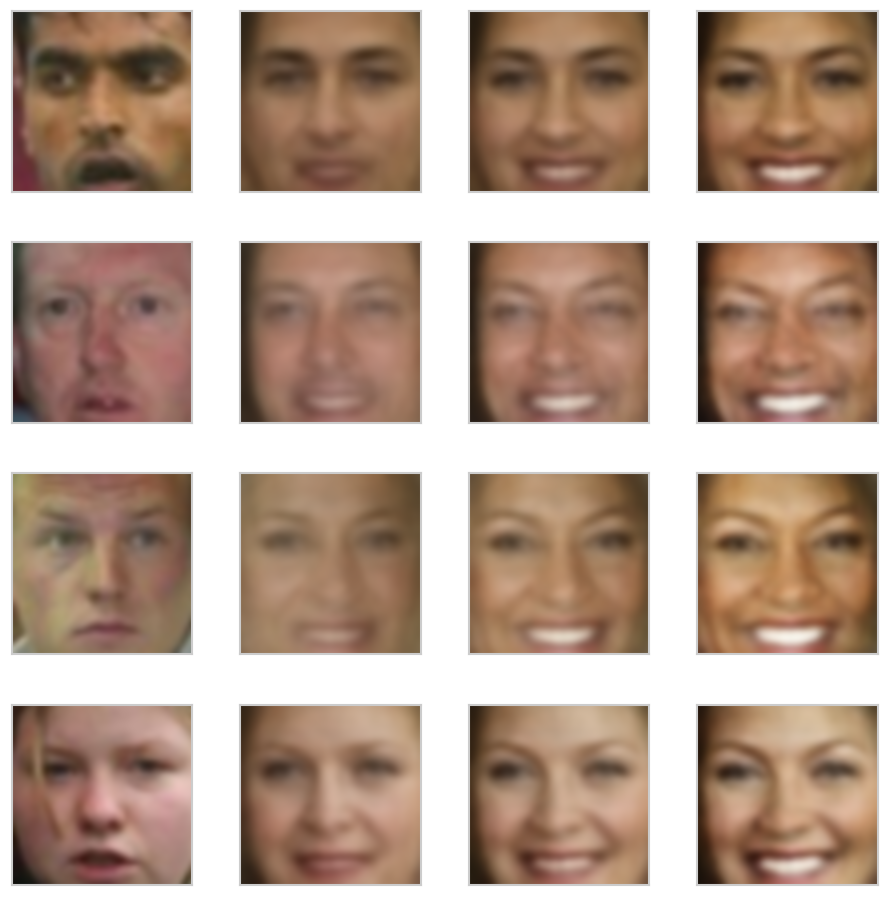

VAE classifier-direction smile edits


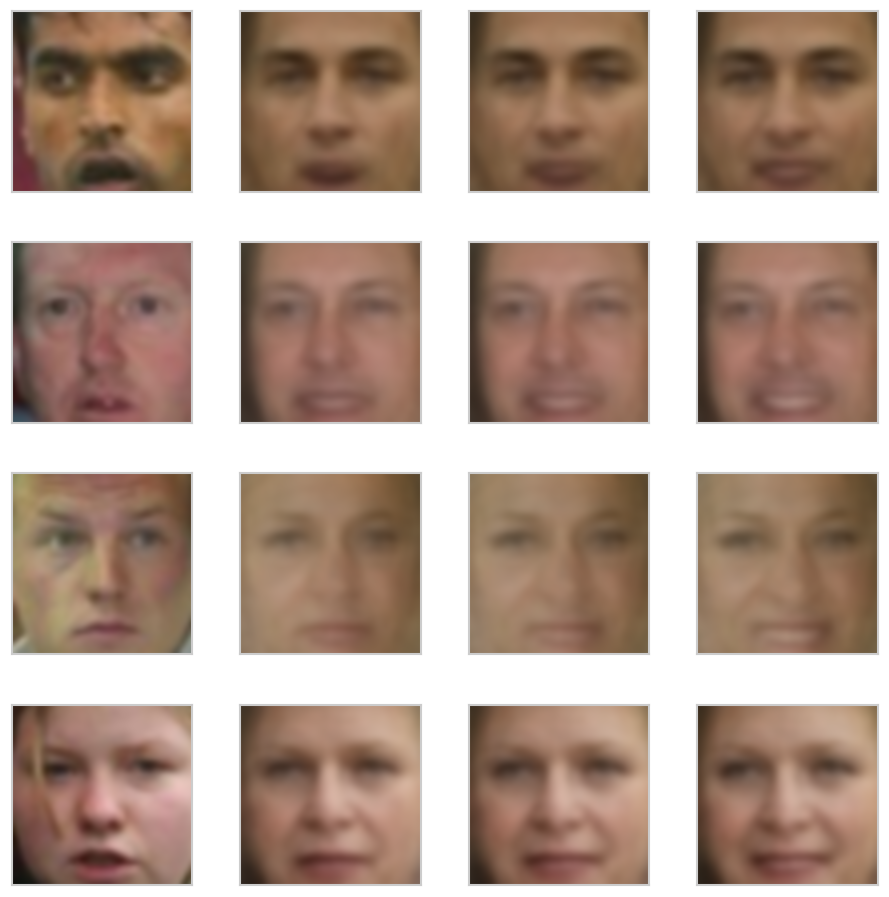

In [62]:
# Supervised smile direction (classifier-based) and comparison with mean-difference direction - VAE
clf_idx = np.random.choice(len(data), size=min(6000, len(data)), replace=False)
latent_subset = to_latent(data[clf_idx]).detach().cpu().numpy()
smile_subset = attrs.iloc[clf_idx]['Smiling'].astype(float).values

q_low, q_high = np.quantile(smile_subset, [0.25, 0.75])
mask = (smile_subset <= q_low) | (smile_subset >= q_high)
X_bin = latent_subset[mask]
y_bin = (smile_subset[mask] >= q_high).astype(int)

clf = LogisticRegression(max_iter=2000)
clf.fit(X_bin, y_bin)
clf_vec = clf.coef_.ravel()
clf_vec = clf_vec / (np.linalg.norm(clf_vec) + 1e-8)

smile_vec_np = smile_vec.detach().cpu().numpy()
smile_vec_np = smile_vec_np / (np.linalg.norm(smile_vec_np) + 1e-8)
cos_sim = float(np.dot(smile_vec_np, clf_vec))
acc = float(clf.score(X_bin, y_bin))

print('[VAE] Binary latent smile classifier accuracy:', round(acc, 4))
print('[VAE] Cosine similarity (mean-diff vs classifier direction):', round(cos_sim, 4))

metrics_df = pd.DataFrame([{
    'model': 'VAE',
    'binary_clf_acc': acc,
    'cosine_similarity': cos_sim,
}])
metrics_df

clf_vec_t = torch.FloatTensor(clf_vec).to(DEVICE)


def show_edit_panel(ids, alphas, direction_tensor, title, n_rows=4):
    ids = list(ids[:n_rows])
    imgs = []
    for idx in ids:
        pic = data[idx:idx+1]
        latent_vec = to_latent(pic)
        row = [pic[0]]
        for a in alphas[1:]:
            edited = from_latent(latent_vec + a * direction_tensor)
            row.append(edited.view(-1, IMAGE_H, IMAGE_W, N_CHANNELS).cpu().numpy()[0])
        imgs.extend(row)

    print(title)
    plot_gallery(imgs, IMAGE_H, IMAGE_W, n_row=len(ids), n_col=len(alphas))


show_edit_panel(no_smile_ids, (0.0, 0.5, 1.0, 1.5), smile_vec, 'VAE mean-difference smile edits', n_rows=4)
show_edit_panel(no_smile_ids, (0.0, 0.6, 1.2, 1.8), clf_vec_t, 'VAE classifier-direction smile edits', n_rows=4)


Smile edits (VAE)


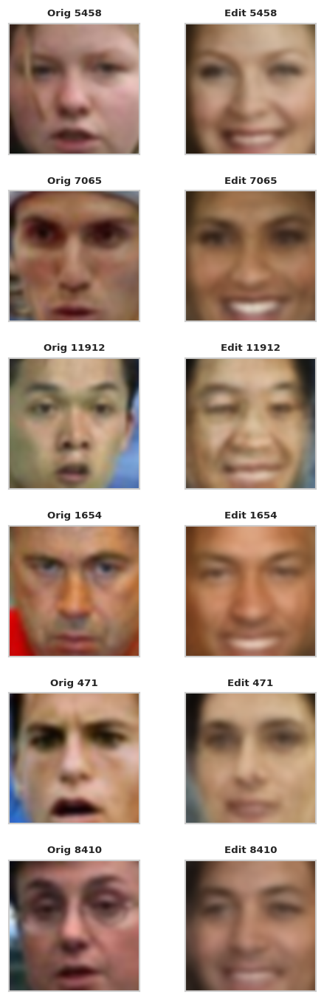

In [63]:
make_me_smile(no_smile_ids, n_samples=6)


Sunglasses edits (VAE)


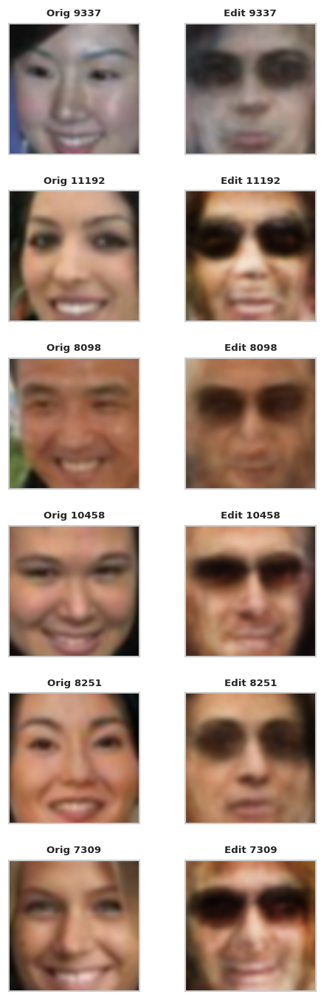

In [64]:
give_me_sunglasses(smile_ids, n_samples=6)


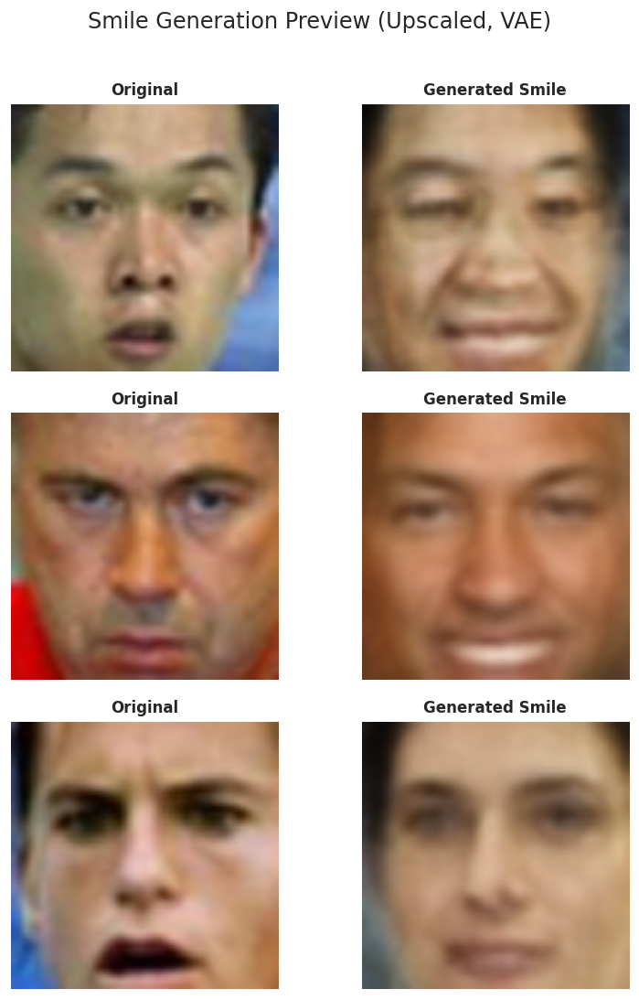

In [65]:
# Extra helper preview (optional): smoother display for generated smiles

def show_smile_preview(sample_ids, out_size=200, n_samples=3):
    rows = []
    for idx in sample_ids[5:n_samples+5]:
        pic = data[idx:idx + 1]
        latent_vec = to_latent(pic)
        latent_vec[0] += smile_vec
        pic_output = from_latent(latent_vec).view(-1, IMAGE_H, IMAGE_W, N_CHANNELS).cpu().numpy()[0]

        base_u8 = (np.clip(pic[0], 0, 1) * 255).astype(np.uint8)
        edit_u8 = (np.clip(pic_output, 0, 1) * 255).astype(np.uint8)

        base_big = cv2.resize(base_u8, (out_size, out_size), interpolation=cv2.INTER_CUBIC)
        edit_big = cv2.resize(edit_u8, (out_size, out_size), interpolation=cv2.INTER_CUBIC)
        rows.append((base_big, edit_big))

    fig, axes = plt.subplots(len(rows), 2, figsize=(7, 3.0 * len(rows)))
    if len(rows) == 1:
        axes = np.array([axes])

    for i, (b, e) in enumerate(rows):
        axes[i, 0].imshow(b)
        axes[i, 0].set_title('Original', fontsize=10)
        axes[i, 0].axis('off')

        axes[i, 1].imshow(e)
        axes[i, 1].set_title('Generated Smile', fontsize=10)
        axes[i, 1].axis('off')

    plt.suptitle('Smile Generation Preview (Upscaled, VAE)', y=1.01)
    plt.tight_layout()
    plt.show()

show_smile_preview(no_smile_ids, out_size=200, n_samples=3)


## 11. Implementation Summary

In summary, I implemented a complete face-generation and latent-editing workflow with:
- structured EDA and attribute-aware preprocessing,
- dense autoencoder training,
- reconstruction diagnostics,
- semantic latent editing,
- and advanced latent-space interpretability analysis.


## 12. Critical Q&A and Extension Path

I closed the notebook with critical discussion points to justify model choices and highlight realistic extensions.

- why this setup works for controlled latent editing,
- when VAE-style regularization may be preferable,
- what future upgrades (e.g., convolutional encoders, identity-preservation metrics, disentanglement constraints) can improve robustness.
